In [5]:
!pip install imageio
!pip install scikit-image

  Using cached lazy_loader-0.4-py3-none-any.whl.metadata (7.6 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.6/13.6 MB 29.1 MB/s  0:00:00m0:00:010:01
Using cached lazy_loader-0.4-py3-none-any.whl (12 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 12.5 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/4 [scikit-image] [scikit-image]


In [4]:
import os
import pandas as pd
import imageio.v2 as imageio
import re
from skimage import measure

# --- CONFIGURATION ---
# Root directory on your hard drive containing the Plate folders
#root_dir = "/media/arnout/Elements/Thesis/Screen crispri quality checked"
root_dir = "/media/arnout/Elements1/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/images"
# Destination for location CSVs on your hard drive
loc_dir = "/media/arnout/Elements1/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations/PLATE1_T2"

os.makedirs(loc_dir, exist_ok=True)

# Minimum pixel area for a bacterium to be included
MIN_AREA_THRESHOLD = 800 

# Regex specifically looks for the C1 mask to use as the reference for the site
mask_pattern = re.compile(r"Sample_(?P<well>[A-Z][0-9]+)_XY(?P<site>[0-9]+)_C1_cp_masks\.tif+")

print(f"Scanning root directory: {root_dir}")
print(f"Generating location files (Reference: C1, Min Area: {MIN_AREA_THRESHOLD})")

found_count = 0

for plate in os.listdir(root_dir):
    if not plate.startswith("PLATE"): continue
    plate_path = os.path.join(root_dir, plate)
    
    for well_folder in os.listdir(plate_path):
        if not well_folder.startswith("Sample_") or "bad_Q" in well_folder: continue
        mask_folder = os.path.join(plate_path, well_folder, "masks")
        
        if os.path.exists(mask_folder):
            for mask_name in os.listdir(mask_folder):
                match = mask_pattern.search(mask_name)
                
                if match:
                    well = match.group('well')
                    site = match.group('site')
                    # DeepProfiler Format: Well-Site-Nuclei.csv (e.g., A1-0-Nuclei.csv)
                    out_filename = f"{well}-{site}-Nuclei.csv"
                    
                    path = os.path.join(mask_folder, mask_name)
                    mask_data = imageio.imread(path)
                    props = measure.regionprops(mask_data)
                    
                    locations = []
                    for p in props:
                        if p.area >= MIN_AREA_THRESHOLD:
                            locations.append({
                                "Nuclei_Location_Center_X": p.centroid[1], 
                                "Nuclei_Location_Center_Y": p.centroid[0]
                            })
                    
                    if locations:
                        df = pd.DataFrame(locations)
                        df.to_csv(os.path.join(loc_dir, out_filename), index=False)
                        found_count += 1
                        print(f"  > Created {out_filename} ({len(locations)} bacteria)")

print(f"\nSuccess! Generated {found_count} location files in: {loc_dir}")

Scanning root directory: /media/arnout/Elements1/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/images
Generating location files (Reference: C1, Min Area: 800)
  > Created A1-0-Nuclei.csv (15 bacteria)
  > Created A1-1-Nuclei.csv (7 bacteria)
  > Created B11-4-Nuclei.csv (213 bacteria)
  > Created B11-5-Nuclei.csv (194 bacteria)
  > Created C2-10-Nuclei.csv (32 bacteria)
  > Created C2-9-Nuclei.csv (5 bacteria)
  > Created D11-0-Nuclei.csv (550 bacteria)
  > Created D11-1-Nuclei.csv (614 bacteria)
  > Created E11-0-Nuclei.csv (206 bacteria)
  > Created E11-1-Nuclei.csv (711 bacteria)

Success! Generated 10 location files in: /media/arnout/Elements1/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations/PLATE1_T2


In [10]:
#moving masks
import os
import shutil

# --- CONFIGURATION ---
# Root directory on your hard drive containing the Plate folders
root_dir = "/media/arnout/Elements/Thesis/Screen crispri quality checked"

# Destination for all masks (the flat folder)
outlines_dest = "/media/arnout/Elements/Thesis/DeepProfiler_Inputs/outlines"

os.makedirs(outlines_dest, exist_ok=True)

print(f"Flattening masks from: {root_dir}")
print(f"Target directory: {outlines_dest}")

count = 0

for plate in os.listdir(root_dir):
    if not plate.startswith("PLATE"): 
        continue
    plate_path = os.path.join(root_dir, plate)
    
    for well_folder in os.listdir(plate_path):
        if not well_folder.startswith("Sample_") or "bad_Q" in well_folder: 
            continue
        
        mask_source_folder = os.path.join(plate_path, well_folder, "masks")
        
        if os.path.exists(mask_source_folder):
            for mask_file in os.listdir(mask_source_folder):
                if mask_file.endswith(".tif") or mask_file.endswith(".tiff"):
                    source_file = os.path.join(mask_source_folder, mask_file)
                    destination_file = os.path.join(outlines_dest, mask_file)
                    
                    # shutil.copy2 preserves metadata (timestamps, etc.)
                    shutil.copy2(source_file, destination_file)
                    count += 1

print(f"\nSuccess! Moved {count} masks to {outlines_dest}")

Flattening masks from: /media/arnout/Elements/Thesis/Screen crispri quality checked
Target directory: /media/arnout/Elements/Thesis/DeepProfiler_Inputs/outlines

Success! Moved 1164 masks to /media/arnout/Elements/Thesis/DeepProfiler_Inputs/outlines


In [11]:
import os
import shutil

# --- CONFIGURATION ---
# Root directory on your hard drive containing the Plate folders
root_dir = "/media/arnout/Elements/Thesis/Screen crispri quality checked"

# Destination for all masks (the flat folder on your hard drive)
outlines_dest = "/media/arnout/Elements/Thesis/DeepProfiler_Inputs/outlines"

os.makedirs(outlines_dest, exist_ok=True)

print(f"Moving masks from: {root_dir}")
print(f"To flat directory: {outlines_dest}")

count = 0

for plate in os.listdir(root_dir):
    if not plate.startswith("PLATE"): 
        continue
    plate_path = os.path.join(root_dir, plate)
    
    for well_folder in os.listdir(plate_path):
        if not well_folder.startswith("Sample_") or "bad_Q" in well_folder: 
            continue
        
        mask_source_folder = os.path.join(plate_path, well_folder, "masks")
        
        if os.path.exists(mask_source_folder):
            for mask_file in os.listdir(mask_source_folder):
                if mask_file.endswith(".tif") or mask_file.endswith(".tiff"):
                    source_path = os.path.join(mask_source_folder, mask_file)
                    destination_path = os.path.join(outlines_dest, mask_file)
                    
                    # shutil.move physically moves the file
                    shutil.move(source_path, destination_path)
                    count += 1
            
            # Optional: Remove the now-empty 'masks' folder to clean up
            try:
                os.rmdir(mask_source_folder)
            except OSError:
                # Folder might not be empty if there are non-tiff files
                pass

print(f"\nSuccess! Moved {count} masks. The 'masks' subfolders have been removed.")

Moving masks from: /media/arnout/Elements/Thesis/Screen crispri quality checked
To flat directory: /media/arnout/Elements/Thesis/DeepProfiler_Inputs/outlines

Success! Moved 1164 masks. The 'masks' subfolders have been removed.


In [12]:
#nu location ding geupdate naar nieuwe mask folder
import os
import pandas as pd
import imageio.v2 as imageio
import re
from skimage import measure

# --- CONFIGURATION ---
# The new flat folder where you moved all the masks
mask_dir = "/media/arnout/Elements/Thesis/DeepProfiler_Inputs/outlines"

# Where to save the location CSVs (Stay on hard drive)
loc_dir = "/media/arnout/Elements/Thesis/DeepProfiler_Inputs/locations/MutantStudy"

os.makedirs(loc_dir, exist_ok=True)

# Minimum pixel area threshold
MIN_AREA_THRESHOLD = 800 

# Regex looks for the C1 mask as the reference
mask_pattern = re.compile(r"Sample_(?P<well>[A-Z][0-9]+)_XY(?P<site>[0-9]+)_C1_cp_masks\.tif+")

print(f"Processing masks from: {mask_dir}")

found_count = 0

for mask_name in os.listdir(mask_dir):
    match = mask_pattern.search(mask_name)
    
    if match:
        well = match.group('well')
        site = match.group('site')
        out_filename = f"{well}-{site}-Nuclei.csv"
        
        path = os.path.join(mask_dir, mask_name)
        mask_data = imageio.imread(path)
        props = measure.regionprops(mask_data)
        
        locations = []
        for p in props:
            if p.area >= MIN_AREA_THRESHOLD:
                locations.append({
                    "Nuclei_Location_Center_X": p.centroid[1], 
                    "Nuclei_Location_Center_Y": p.centroid[0]
                })
        
        if locations:
            df = pd.DataFrame(locations)
            df.to_csv(os.path.join(loc_dir, out_filename), index=False)
            found_count += 1

print(f"\nSuccess! Generated {found_count} location files.")

Processing masks from: /media/arnout/Elements/Thesis/DeepProfiler_Inputs/outlines

Success! Generated 1162 location files.


Inspecting A1 Site 0
Found 15 objects in location file.


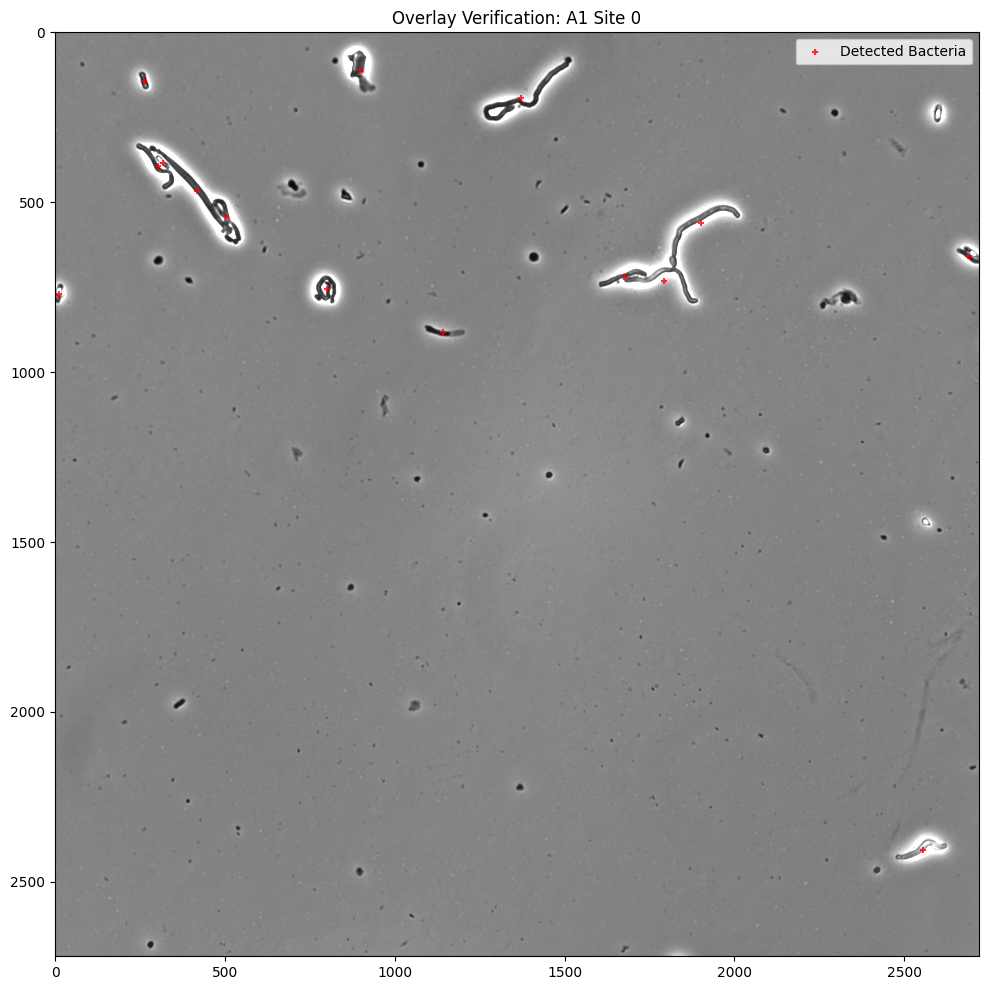

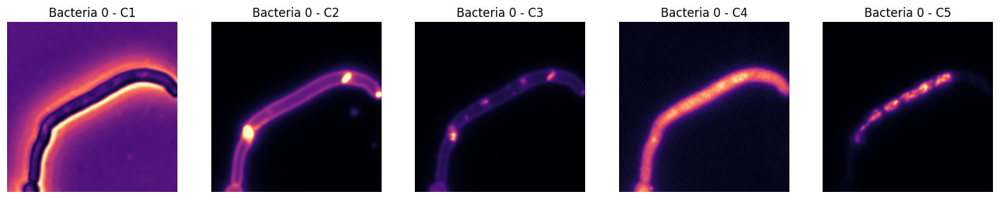

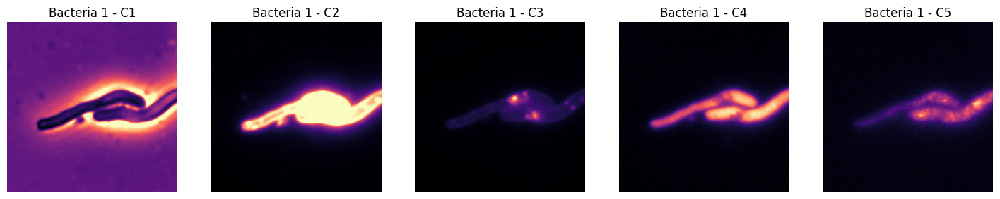

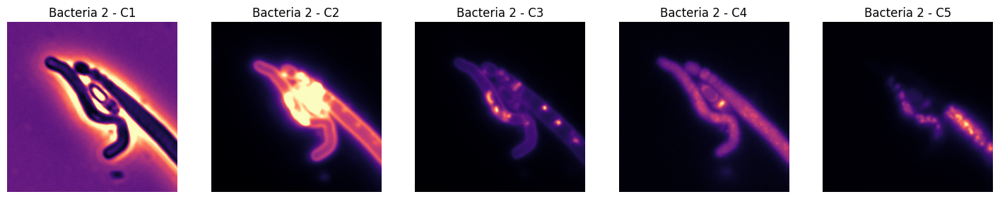

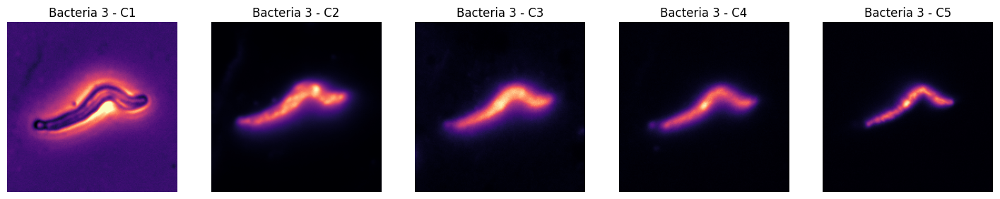

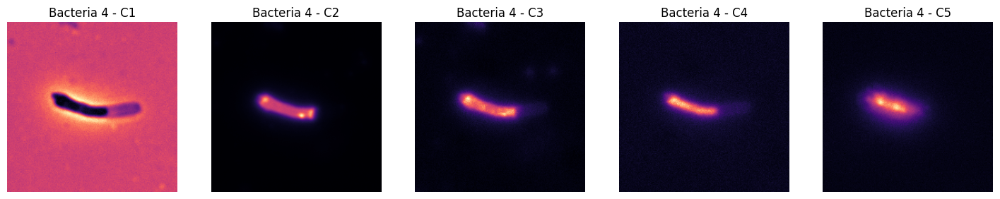

In [2]:
#check juist center profiling zegt idd 15 cells dus ok:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import skimage.io
import os

# --- NEW CONFIGURATION (HARD DRIVE) ---
# Location of your generated CSVs
loc_dir = "/media/arnout/Elements/Thesis/my_dp_project (Copy)/inputs/locations/PLATE1_T2"
# Location of your raw images (via the symlink or direct path)
image_dir = "/media/arnout/Elements/Thesis/Screen crispri quality checked"
# Your index file
index_meta_path = "/media/arnout/Elements/Thesis/my_dp_project (Copy)/inputs/metadata/index.csv"

# 1. Pick a specific Well and Site to inspect
target_well = "A1"
target_site = 0

# 2. Load the index to find the image paths
idx_df = pd.read_csv(index_meta_path)
row = idx_df[(idx_df['Metadata_Well'] == target_well) & (idx_df['Metadata_Site'] == target_site)].iloc[0]

# 3. Load the coordinates directly from your new location file
loc_file = os.path.join(loc_dir, f"{target_well}-{target_site}-Nuclei.csv")
site_data = pd.read_csv(loc_file)

print(f"Inspecting {target_well} Site {target_site}")
print(f"Found {len(site_data)} objects in location file.")

# --- PART A: FULL IMAGE OVERLAY ---
c1_path = os.path.join(image_dir, row['C1'])
img_c1 = skimage.io.imread(c1_path)

plt.figure(figsize=(12, 12))
vmax = np.percentile(img_c1, 99.5)  # Contrast stretch
plt.imshow(img_c1, cmap='gray', vmax=vmax)
plt.scatter(site_data['Nuclei_Location_Center_X'], 
            site_data['Nuclei_Location_Center_Y'], 
            s=20, c='red', marker='+', alpha=0.8, label='Detected Bacteria')
plt.title(f"Overlay Verification: {target_well} Site {target_site}")
plt.legend()
plt.show()

# --- PART B: INDIVIDUAL CROPS ---
# View 5 random bacteria to check centering
sample_cells = site_data.sample(5)
box_size = 224 # DeepProfiler uses 224 in your config
half_box = box_size // 2

for i, (_, cell) in enumerate(sample_cells.iterrows()):
    cx, cy = int(cell['Nuclei_Location_Center_X']), int(cell['Nuclei_Location_Center_Y'])
    
    fig, axes = plt.subplots(1, 5, figsize=(18, 4))
    channels = ['C1', 'C2', 'C3', 'C4', 'C5']
    
    for j, ch_key in enumerate(channels):
        ch_full = skimage.io.imread(os.path.join(image_dir, row[ch_key]))
        
        # Crop with bounds checking
        y1, y2 = max(0, cy-half_box), min(ch_full.shape[0], cy+half_box)
        x1, x2 = max(0, cx-half_box), min(ch_full.shape[1], cx+half_box)
        crop = ch_full[y1:y2, x1:x2]
        
        axes[j].imshow(crop, cmap='magma')
        axes[j].set_title(f"Bacteria {i} - {ch_key}")
        axes[j].axis('off')
    plt.show()

Inspecting G10 Site 9
Found 533 objects in location file.


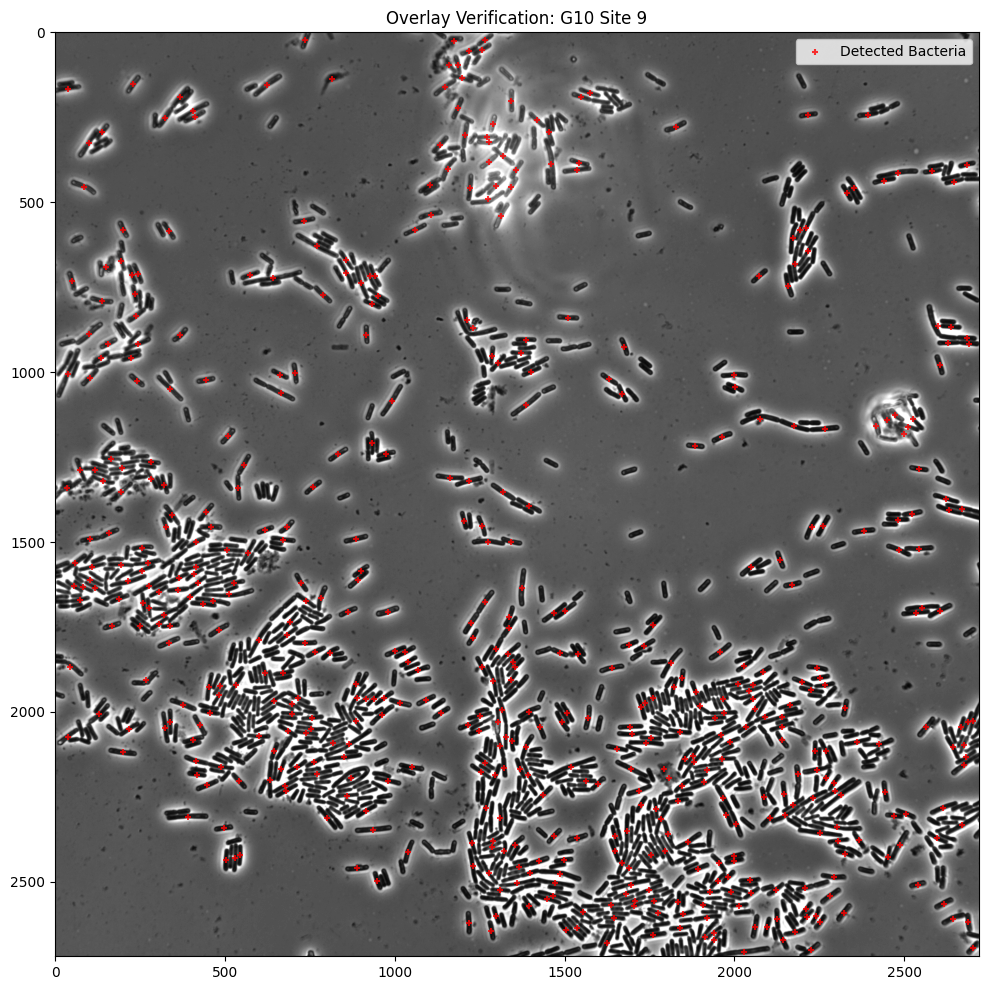

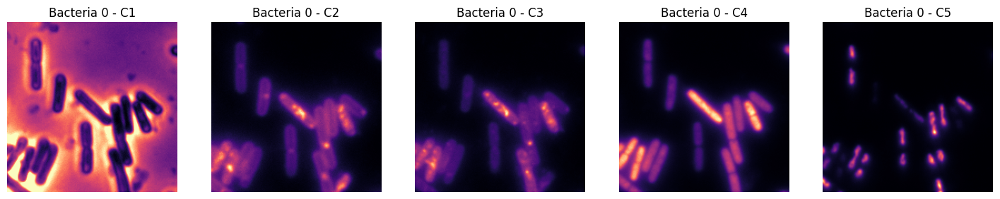

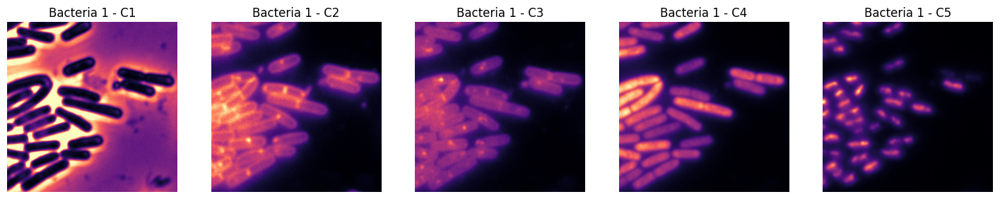

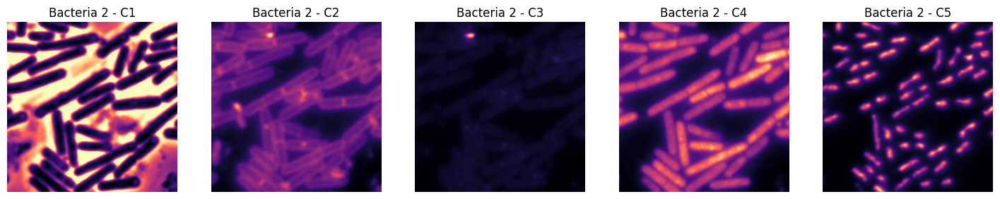

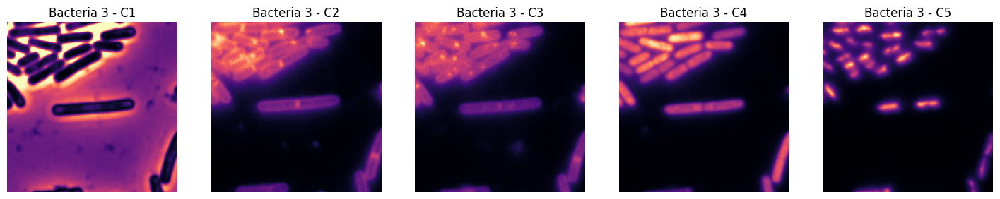

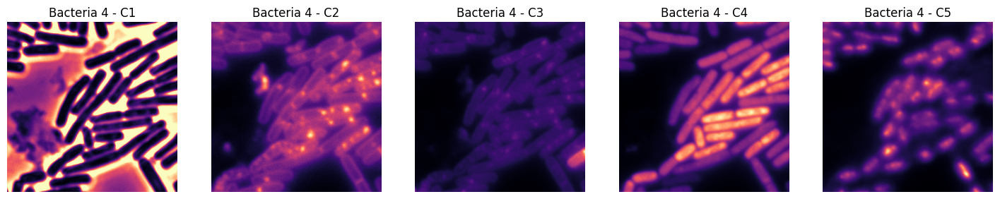

In [5]:
#check juist center:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import skimage.io
import os

# --- NEW CONFIGURATION (HARD DRIVE) ---
# Location of your generated CSVs
loc_dir = "/media/arnout/Elements/Thesis/my_dp_project (Copy)/inputs/locations/PLATE1_T2"
# Location of your raw images (via the symlink or direct path)
image_dir = "/media/arnout/Elements/Thesis/Screen crispri quality checked"
# Your index file
index_meta_path = "/media/arnout/Elements/Thesis/my_dp_project (Copy)/inputs/metadata/index.csv"

# 1. Pick a specific Well and Site to inspect
target_well = "G10"        #profiing zet 638 cells
target_site = 9

# 2. Load the index to find the image paths
idx_df = pd.read_csv(index_meta_path)
row = idx_df[(idx_df['Metadata_Well'] == target_well) & (idx_df['Metadata_Site'] == target_site)].iloc[0]

# 3. Load the coordinates directly from your new location file
loc_file = os.path.join(loc_dir, f"{target_well}-{target_site}-Nuclei.csv")
site_data = pd.read_csv(loc_file)

print(f"Inspecting {target_well} Site {target_site}")
print(f"Found {len(site_data)} objects in location file.")

# --- PART A: FULL IMAGE OVERLAY ---
c1_path = os.path.join(image_dir, row['C1'])
img_c1 = skimage.io.imread(c1_path)

plt.figure(figsize=(12, 12))
vmax = np.percentile(img_c1, 99.5)  # Contrast stretch
plt.imshow(img_c1, cmap='gray', vmax=vmax)
plt.scatter(site_data['Nuclei_Location_Center_X'], 
            site_data['Nuclei_Location_Center_Y'], 
            s=20, c='red', marker='+', alpha=0.8, label='Detected Bacteria')
plt.title(f"Overlay Verification: {target_well} Site {target_site}")
plt.legend()
plt.show()

# --- PART B: INDIVIDUAL CROPS ---
# View 5 random bacteria to check centering
sample_cells = site_data.sample(5)
box_size = 224 # DeepProfiler uses 224 in your config
half_box = box_size // 2

for i, (_, cell) in enumerate(sample_cells.iterrows()):
    cx, cy = int(cell['Nuclei_Location_Center_X']), int(cell['Nuclei_Location_Center_Y'])
    
    fig, axes = plt.subplots(1, 5, figsize=(18, 4))
    channels = ['C1', 'C2', 'C3', 'C4', 'C5']
    
    for j, ch_key in enumerate(channels):
        ch_full = skimage.io.imread(os.path.join(image_dir, row[ch_key]))
        
        # Crop with bounds checking
        y1, y2 = max(0, cy-half_box), min(ch_full.shape[0], cy+half_box)
        x1, x2 = max(0, cx-half_box), min(ch_full.shape[1], cx+half_box)
        crop = ch_full[y1:y2, x1:x2]
        
        axes[j].imshow(crop, cmap='magma')
        axes[j].set_title(f"Bacteria {i} - {ch_key}")
        axes[j].axis('off')
    plt.show()

In [ ]:
###########locations based on images all in same folder

In [ ]:
import os
import pandas as pd
import imageio.v2 as imageio
import re
from skimage import measure
from tqdm import tqdm  # Highly recommended for progress tracking

# --- CONFIGURATION ---
# The single folder containing all your mask .tif files
mask_dir = "/media/arnout/Elements1/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/images/ALL_MASKS"
# Destination for DeepProfiler-ready CSVs
loc_dir = "/media/arnout/Elements1/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations/PLATE1_T2"

os.makedirs(loc_dir, exist_ok=True)

MIN_AREA_THRESHOLD = 800 

# Updated Regex: Assumes the filename contains the Well and Site information
# Adjust this pattern if your unique names follow a different format
mask_pattern = re.compile(r"Sample_(?P<well>[A-Z][0-9]+)_XY(?P<site>[0-9]+)_C1_cp_masks\.tif")

print(f"Processing masks from: {mask_dir}")

# Get list of all tif files in the folder
mask_files = [f for f in os.listdir(mask_dir) if f.endswith(".tif")]
found_count = 0

# Using tqdm provides a progress bar which is great for large "grote" datasets
for mask_name in tqdm(mask_files, desc="Extracting Centroids"):
    match = mask_pattern.search(mask_name)
    
    if match:
        well = match.group('well')
        site = match.group('site')
        out_filename = f"{well}-{site}-Nuclei.csv"
        
        # Read and process
        mask_path = os.path.join(mask_dir, mask_name)
        mask_data = imageio.imread(mask_path)
        props = measure.regionprops(mask_data)
        
        # Extract centroids (Y, X) -> (X, Y)
        locations = [
            {
                "Nuclei_Location_Center_X": p.centroid[1], 
                "Nuclei_Location_Center_Y": p.centroid[0]
            }
            for p in props if p.area >= MIN_AREA_THRESHOLD
        ]
        
        if locations:
            df = pd.DataFrame(locations)
            df.to_csv(os.path.join(loc_dir, out_filename), index=False)
            found_count += 1

print(f"\nSuccess! Generated {found_count} location files in: {loc_dir}")

In [ ]:
#####max neighbours

In [22]:
import os
import pandas as pd
import imageio.v2 as imageio
import re
from skimage import measure
from scipy.spatial import KDTree  # Essential for fast distance lookups

# --- CONFIGURATION ---
root_dir = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/images_neighbours"
loc_dir = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations_neighbours/PLATE1_T2"
os.makedirs(loc_dir, exist_ok=True)

MIN_AREA_THRESHOLD = 700 
BOX_SIZE = 112
# Set your threshold here: e.g., 0 means only isolated cells, 1 means max 1 neighbor
MAX_NEIGHBORS = 1 

mask_pattern = re.compile(r"Sample_(?P<well>[A-Z][0-9]+)_XY(?P<site>[0-9]+)_C1_cp_masks\.tif+")

found_count = 0

for plate in os.listdir(root_dir):
    if not plate.startswith("PLATE"): continue
    plate_path = os.path.join(root_dir, plate)
    
    for well_folder in os.listdir(plate_path):
        if not well_folder.startswith("Sample_") or "bad_Q" in well_folder: continue
        mask_folder = os.path.join(plate_path, well_folder, "masks")
        
        if os.path.exists(mask_folder):
            for mask_name in os.listdir(mask_folder):
                match = mask_pattern.search(mask_name)
                if not match: continue
                
                well = match.group('well')
                site = match.group('site')
                out_filename = f"{well}-{site}-Nuclei.csv"
                
                # Load mask and get centroids
                mask_data = imageio.imread(os.path.join(mask_folder, mask_name))
                props = measure.regionprops(mask_data)
                
                # Filter by area first
                coords = [[p.centroid[1], p.centroid[0]] for p in props if p.area >= MIN_AREA_THRESHOLD]
                
                if not coords: continue

                # --- NEIGHBOR CALCULATION ---
                # Build a tree of all valid cell centers
                tree = KDTree(coords)
                
                final_locations = []
                for i, point in enumerate(coords):
                    # count_neighbors finds points within the distance BOX_SIZE
                    # We subtract 1 because the point always finds itself
                    neighbor_count = tree.query_ball_point(point, r=BOX_SIZE, return_length=True) - 1
                    
                    if neighbor_count <= MAX_NEIGHBORS:
                        final_locations.append({
                            "Nuclei_Location_Center_X": point[0], 
                            "Nuclei_Location_Center_Y": point[1],
                            "Neighbor_Count": neighbor_count # Added for your reference
                        })
                
                if final_locations:
                    df = pd.DataFrame(final_locations)
                    df.to_csv(os.path.join(loc_dir, out_filename), index=False)
                    found_count += 1
                    print(f"  > Created {out_filename}: {len(final_locations)} cells kept (Filtered from {len(coords)})")

print(f"\nSuccess! Generated {found_count} filtered location files.")

  > Created A1-0-Nuclei.csv: 18 cells kept (Filtered from 18)
  > Created A1-1-Nuclei.csv: 7 cells kept (Filtered from 7)
  > Created B11-4-Nuclei.csv: 19 cells kept (Filtered from 322)
  > Created B11-5-Nuclei.csv: 33 cells kept (Filtered from 308)
  > Created C2-10-Nuclei.csv: 17 cells kept (Filtered from 34)
  > Created C2-9-Nuclei.csv: 5 cells kept (Filtered from 5)
  > Created D11-0-Nuclei.csv: 56 cells kept (Filtered from 800)
  > Created D11-1-Nuclei.csv: 65 cells kept (Filtered from 859)
  > Created E11-0-Nuclei.csv: 63 cells kept (Filtered from 319)
  > Created E11-1-Nuclei.csv: 54 cells kept (Filtered from 984)

Success! Generated 10 filtered location files.


In [32]:
import os
import pandas as pd
import imageio.v2 as imageio
import re
from skimage import measure
from scipy.spatial import KDTree 

# --- CONFIGURATION ---
root_dir = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/images_neighbours"
loc_dir = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations_neighbours/PLATE1_T2"
os.makedirs(loc_dir, exist_ok=True)

MIN_AREA_THRESHOLD = 700 
BOX_SIZE = 224
# For a 224x224 box, the "radius" from the center to the edge is 112
SQUARE_RADIUS = BOX_SIZE / 2  
MAX_NEIGHBORS = 2 

mask_pattern = re.compile(r"Sample_(?P<well>[A-Z][0-9]+)_XY(?P<site>[0-9]+)_C1_cp_masks\.tif+")

found_count = 0

for plate in os.listdir(root_dir):
    if not plate.startswith("PLATE"): continue
    plate_path = os.path.join(root_dir, plate)
    
    for well_folder in os.listdir(plate_path):
        if not well_folder.startswith("Sample_") or "bad_Q" in well_folder: continue
        mask_folder = os.path.join(plate_path, well_folder, "masks")
        
        if os.path.exists(mask_folder):
            for mask_name in os.listdir(mask_folder):
                match = mask_pattern.search(mask_name)
                if not match: continue
                
                well = match.group('well')
                site = match.group('site')
                out_filename = f"{well}-{site}-Nuclei.csv"
                
                mask_data = imageio.imread(os.path.join(mask_folder, mask_name))
                props = measure.regionprops(mask_data)
                
                coords = [[p.centroid[1], p.centroid[0]] for p in props if p.area >= MIN_AREA_THRESHOLD]
                if not coords: continue

                # --- SQUARE NEIGHBOR CALCULATION ---
                tree = KDTree(coords)
                
                final_locations = []
                for i, point in enumerate(coords):
                    # p=float('inf') switches KDTree to Chebyshev (Square) distance
                    neighbor_count = tree.query_ball_point(point, r=SQUARE_RADIUS, p=float('inf'), return_length=True) - 1
                    
                    if neighbor_count <= MAX_NEIGHBORS:
                        final_locations.append({
                            "Nuclei_Location_Center_X": point[0], 
                            "Nuclei_Location_Center_Y": point[1],
                            "Neighbor_Count": neighbor_count 
                        })
                
                if final_locations:
                    save_path = os.path.join(loc_dir, out_filename)
                    df = pd.DataFrame(final_locations)
                    df.to_csv(save_path, index=False)
                    found_count += 1
                    # Printing full path to verify exactly where it saves
                    print(f"  > Saved to: {save_path} ({len(final_locations)} cells)")

print(f"\nSuccess! Total location files: {found_count}")

  > Saved to: /media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations_neighbours/PLATE1_T2/A1-0-Nuclei.csv (18 cells)
  > Saved to: /media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations_neighbours/PLATE1_T2/A1-1-Nuclei.csv (7 cells)
  > Saved to: /media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations_neighbours/PLATE1_T2/B11-4-Nuclei.csv (35 cells)
  > Saved to: /media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations_neighbours/PLATE1_T2/B11-5-Nuclei.csv (48 cells)
  > Saved to: /media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations_neighbours/PLATE1_T2/C2-10-Nuclei.csv (24 cells)
  > Saved to: /media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations_neighbours/PLATE1_T2/C2-9-Nuclei.csv (5 cells)
  > Saved to: /media/arnout/Elements/groteEdeepprof

In [49]:
import os
import pandas as pd
import imageio.v2 as imageio
import re
import numpy as np
from skimage import measure
from scipy.spatial import KDTree 

# --- CONFIGURATION ---
root_dir = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/images_neighbours"
loc_dir = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations_neighbours/PLATE1_T2"
os.makedirs(loc_dir, exist_ok=True)

MIN_AREA_THRESHOLD = 700 
BOX_SIZE = 224
SQUARE_RADIUS = BOX_SIZE / 2  # 112 pixels
MAX_NEIGHBORS = 2  # Maximum neighbors allowed within the square box

mask_pattern = re.compile(r"Sample_(?P<well>[A-Z][0-9]+)_XY(?P<site>[0-9]+)_C1_cp_masks\.tif+")

found_count = 0

for plate in os.listdir(root_dir):
    if not plate.startswith("PLATE"): continue
    plate_path = os.path.join(root_dir, plate)
    
    for well_folder in os.listdir(plate_path):
        if not well_folder.startswith("Sample_") or "bad_Q" in well_folder: continue
        mask_folder = os.path.join(plate_path, well_folder, "masks")
        
        if os.path.exists(mask_folder):
            for mask_name in os.listdir(mask_folder):
                match = mask_pattern.search(mask_name)
                if not match: continue
                
                well = match.group('well')
                site = match.group('site')
                out_filename = f"{well}-{site}-Nuclei.csv"
                
                mask_data = imageio.imread(os.path.join(mask_folder, mask_name))
                props = measure.regionprops(mask_data)
                
                all_coords = np.array([[p.centroid[1], p.centroid[0]] for p in props if p.area >= MIN_AREA_THRESHOLD])
                
                if len(all_coords) == 0: continue

                # --- SPATIAL FILTERING & DE-DUPLICATION ---
                tree = KDTree(all_coords)
                keep_indices = []
                # 'claimed' tracks area already covered by a kept box
                claimed = np.zeros(len(all_coords), dtype=bool)

                for i in range(len(all_coords)):
                    # 1. Neighbor Count Check (Chebyshev/Square distance)
                    # We check the raw count before deciding to keep/discard
                    neighbor_indices = tree.query_ball_point(all_coords[i], r=SQUARE_RADIUS, p=float('inf'))
                    neighbor_count = len(neighbor_indices) - 1
                    
                    # 2. Filtering Logic
                    # Keep if: it hasn't been claimed AND it's not in a crowd
                    if not claimed[i] and neighbor_count <= MAX_NEIGHBORS:
                        keep_indices.append(i)
                        # Mark all neighbors as 'claimed' so we don't pick 2 nuclei in one box
                        claimed[neighbor_indices] = True
                    elif not claimed[i] and neighbor_count > MAX_NEIGHBORS:
                        # Even if not claimed, if it's too crowded, we ignore it
                        # and mark its neighbors so we don't pick them either (optional but cleaner)
                        claimed[neighbor_indices] = True

                final_locations = [
                    {
                        "Nuclei_Location_Center_X": all_coords[idx][0], 
                        "Nuclei_Location_Center_Y": all_coords[idx][1]
                    }
                    for idx in keep_indices
                ]
                
                if final_locations:
                    save_path = os.path.join(loc_dir, out_filename)
                    pd.DataFrame(final_locations).to_csv(save_path, index=False)
                    found_count += 1
                    print(f"  > Created {out_filename}: {len(final_locations)} cells kept (Filtered from {len(all_coords)})")

print(f"\nSuccess! Total location files: {found_count}")

  > Created A1-0-Nuclei.csv: 16 cells kept (Filtered from 18)
  > Created A1-1-Nuclei.csv: 6 cells kept (Filtered from 7)
  > Created B11-4-Nuclei.csv: 25 cells kept (Filtered from 322)
  > Created B11-5-Nuclei.csv: 31 cells kept (Filtered from 308)
  > Created C2-10-Nuclei.csv: 17 cells kept (Filtered from 34)
  > Created C2-9-Nuclei.csv: 5 cells kept (Filtered from 5)
  > Created D11-0-Nuclei.csv: 44 cells kept (Filtered from 800)
  > Created D11-1-Nuclei.csv: 61 cells kept (Filtered from 859)
  > Created E11-0-Nuclei.csv: 54 cells kept (Filtered from 319)
  > Created E11-1-Nuclei.csv: 43 cells kept (Filtered from 984)

Success! Total location files: 10


Inspecting A1 Site 0
Found 16 objects in location file.


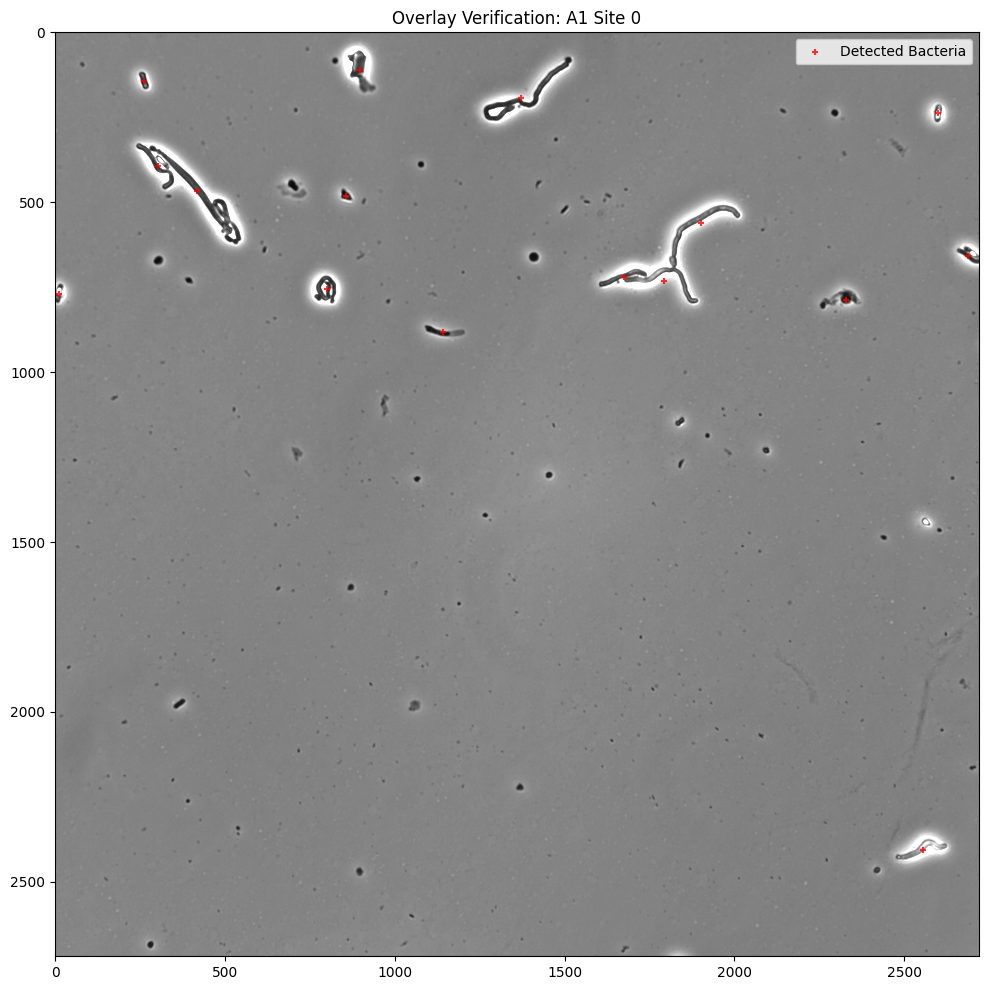

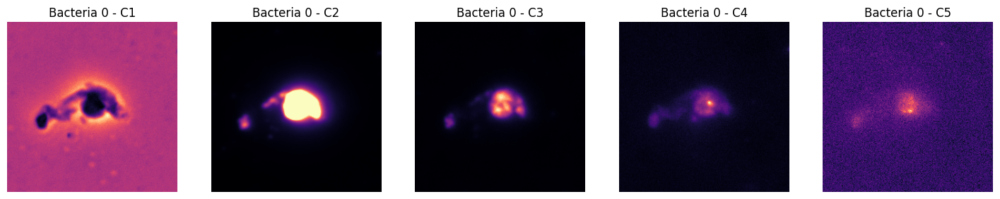

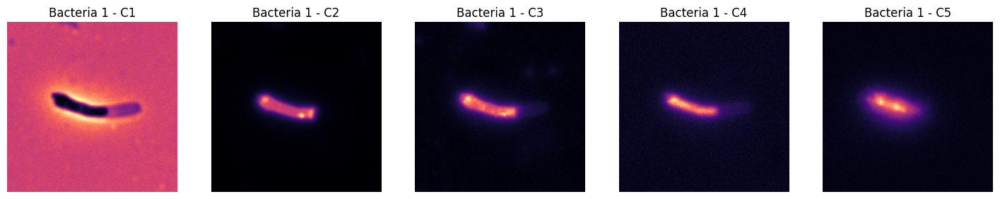

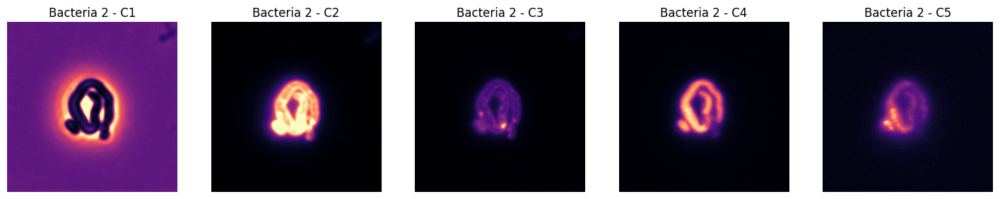

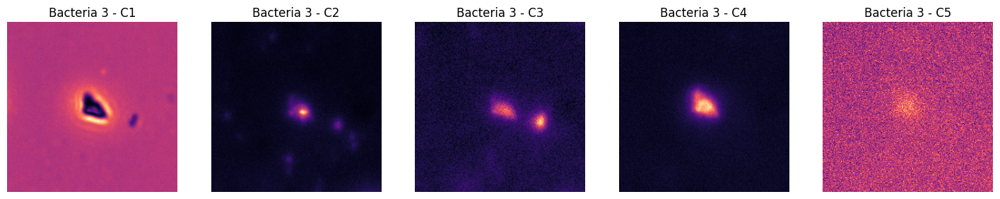

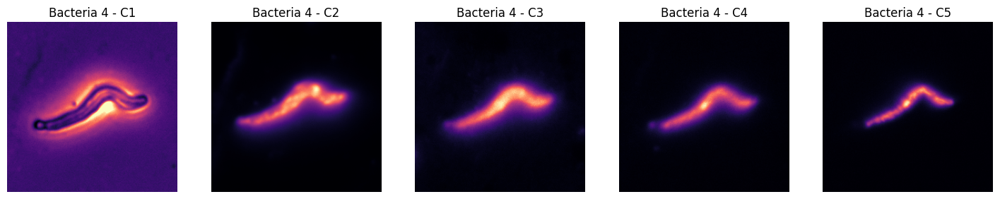

In [50]:
#check juist center profiling zegt idd 15 cells dus ok:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import skimage.io
import os

# --- NEW CONFIGURATION (HARD DRIVE) ---
# Location of your generated CSVs
loc_dir = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations_neighbours/PLATE1_T2"
# Location of your raw images (via the symlink or direct path)
image_dir = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/images"
# Your index file
index_meta_path = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/metadata/index.csv"

# 1. Pick a specific Well and Site to inspect
target_well = "A1"
target_site = 0

# 2. Load the index to find the image paths
idx_df = pd.read_csv(index_meta_path)
row = idx_df[(idx_df['Metadata_Well'] == target_well) & (idx_df['Metadata_Site'] == target_site)].iloc[0]

# 3. Load the coordinates directly from your new location file
loc_file = os.path.join(loc_dir, f"{target_well}-{target_site}-Nuclei.csv")
site_data = pd.read_csv(loc_file)

print(f"Inspecting {target_well} Site {target_site}")
print(f"Found {len(site_data)} objects in location file.")

# --- PART A: FULL IMAGE OVERLAY ---
c1_path = os.path.join(image_dir, row['C1'])
img_c1 = skimage.io.imread(c1_path)

plt.figure(figsize=(12, 12))
vmax = np.percentile(img_c1, 99.5)  # Contrast stretch
plt.imshow(img_c1, cmap='gray', vmax=vmax)
plt.scatter(site_data['Nuclei_Location_Center_X'], 
            site_data['Nuclei_Location_Center_Y'], 
            s=20, c='red', marker='+', alpha=0.8, label='Detected Bacteria')
plt.title(f"Overlay Verification: {target_well} Site {target_site}")
plt.legend()
plt.show()

# --- PART B: INDIVIDUAL CROPS ---
# View 5 random bacteria to check centering
sample_cells = site_data.sample(5)
box_size = 224 # DeepProfiler uses 224 in your config
half_box = box_size // 2

for i, (_, cell) in enumerate(sample_cells.iterrows()):
    cx, cy = int(cell['Nuclei_Location_Center_X']), int(cell['Nuclei_Location_Center_Y'])
    
    fig, axes = plt.subplots(1, 5, figsize=(18, 4))
    channels = ['C1', 'C2', 'C3', 'C4', 'C5']
    
    for j, ch_key in enumerate(channels):
        ch_full = skimage.io.imread(os.path.join(image_dir, row[ch_key]))
        
        # Crop with bounds checking
        y1, y2 = max(0, cy-half_box), min(ch_full.shape[0], cy+half_box)
        x1, x2 = max(0, cx-half_box), min(ch_full.shape[1], cx+half_box)
        crop = ch_full[y1:y2, x1:x2]
        
        axes[j].imshow(crop, cmap='magma')
        axes[j].set_title(f"Bacteria {i} - {ch_key}")
        axes[j].axis('off')
    plt.show()

Inspecting E11 Site 1
Found 43 objects in location file.


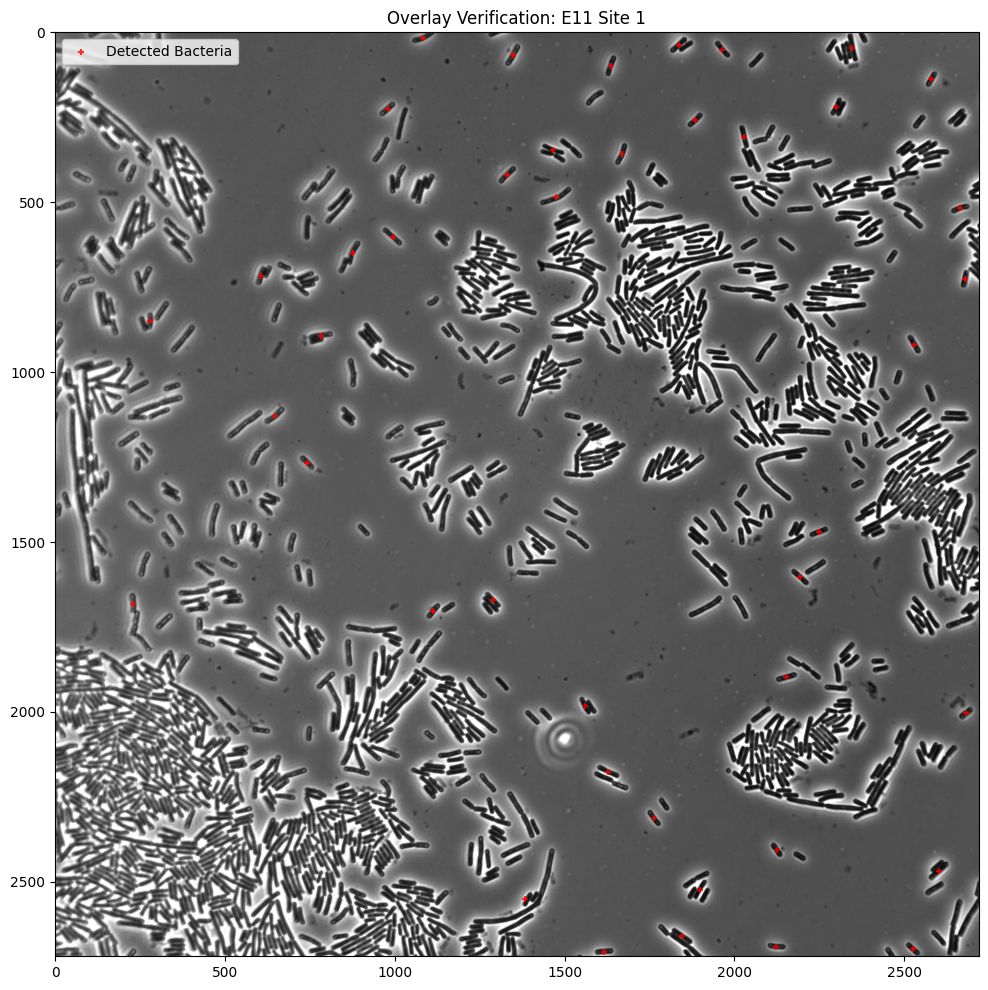

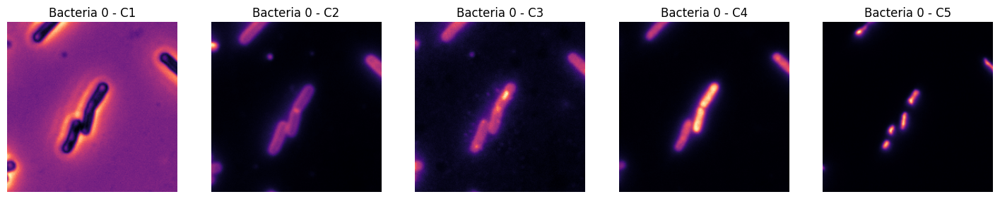

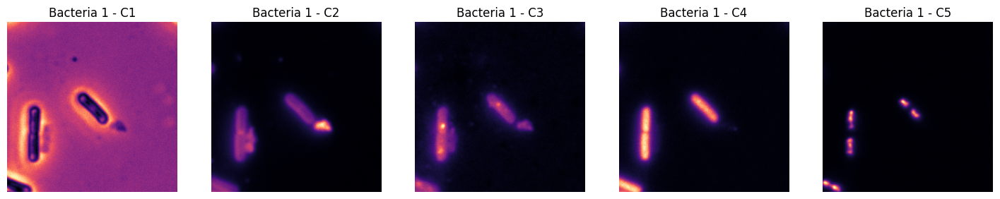

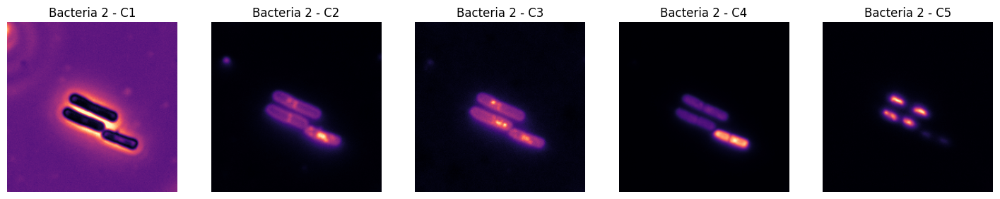

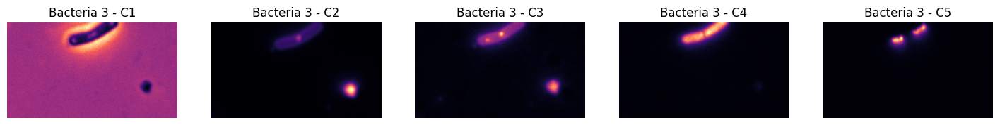

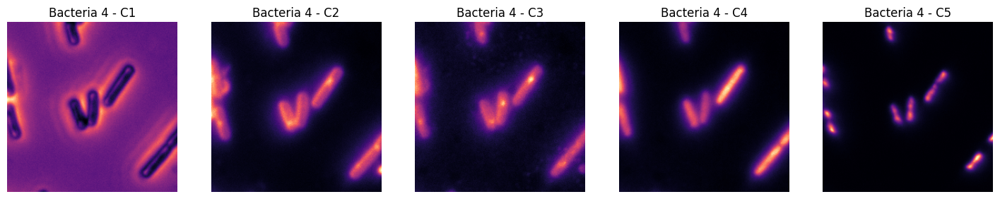

In [51]:
#check juist center profiling zegt idd 15 cells dus ok:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import skimage.io
import os

# --- NEW CONFIGURATION (HARD DRIVE) ---
# Location of your generated CSVs
loc_dir = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations_neighbours/PLATE1_T2"
# Location of your raw images (via the symlink or direct path)
image_dir = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/images"
# Your index file
index_meta_path = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/metadata/index.csv"

# 1. Pick a specific Well and Site to inspect
target_well = "E11"
target_site = 1

# 2. Load the index to find the image paths
idx_df = pd.read_csv(index_meta_path)
row = idx_df[(idx_df['Metadata_Well'] == target_well) & (idx_df['Metadata_Site'] == target_site)].iloc[0]

# 3. Load the coordinates directly from your new location file
loc_file = os.path.join(loc_dir, f"{target_well}-{target_site}-Nuclei.csv")
site_data = pd.read_csv(loc_file)

print(f"Inspecting {target_well} Site {target_site}")
print(f"Found {len(site_data)} objects in location file.")

# --- PART A: FULL IMAGE OVERLAY ---
c1_path = os.path.join(image_dir, row['C1'])
img_c1 = skimage.io.imread(c1_path)

plt.figure(figsize=(12, 12))
vmax = np.percentile(img_c1, 99.5)  # Contrast stretch
plt.imshow(img_c1, cmap='gray', vmax=vmax)
plt.scatter(site_data['Nuclei_Location_Center_X'], 
            site_data['Nuclei_Location_Center_Y'], 
            s=20, c='red', marker='+', alpha=0.8, label='Detected Bacteria')
plt.title(f"Overlay Verification: {target_well} Site {target_site}")
plt.legend()
plt.show()

# --- PART B: INDIVIDUAL CROPS ---
# View 5 random bacteria to check centering
sample_cells = site_data.sample(5)
box_size = 224 # DeepProfiler uses 224 in your config
half_box = box_size // 2

for i, (_, cell) in enumerate(sample_cells.iterrows()):
    cx, cy = int(cell['Nuclei_Location_Center_X']), int(cell['Nuclei_Location_Center_Y'])
    
    fig, axes = plt.subplots(1, 5, figsize=(18, 4))
    channels = ['C1', 'C2', 'C3', 'C4', 'C5']
    
    for j, ch_key in enumerate(channels):
        ch_full = skimage.io.imread(os.path.join(image_dir, row[ch_key]))
        
        # Crop with bounds checking
        y1, y2 = max(0, cy-half_box), min(ch_full.shape[0], cy+half_box)
        x1, x2 = max(0, cx-half_box), min(ch_full.shape[1], cx+half_box)
        crop = ch_full[y1:y2, x1:x2]
        
        axes[j].imshow(crop, cmap='magma')
        axes[j].set_title(f"Bacteria {i} - {ch_key}")
        axes[j].axis('off')
    plt.show()

In [ ]:
#####full plate locationfile
import os
import pandas as pd
import imageio.v2 as imageio
import re
import numpy as np
from skimage import measure
from scipy.spatial import KDTree 

# --- CONFIGURATION ---
root_dir = "/media/arnout/Elements1/Thesis/Screen crispri quality checked"
loc_dir = "/media/arnout/Elements1/Thesis/my_dp_project_neighbours/inputs/locations/PLATE1_T2"
os.makedirs(loc_dir, exist_ok=True)

MIN_AREA_THRESHOLD = 700 
BOX_SIZE = 224
SQUARE_RADIUS = BOX_SIZE / 2  # 112 pixels
MAX_NEIGHBORS = 2  # Maximum neighbors allowed within the square box

mask_pattern = re.compile(r"Sample_(?P<well>[A-Z][0-9]+)_XY(?P<site>[0-9]+)_C1_cp_masks\.tif+")

found_count = 0

for plate in ["PLATE1_T2"]:
    if not plate.startswith("PLATE"): continue
    plate_path = os.path.join(root_dir, plate)
    
    for well_folder in os.listdir(plate_path):
        if not well_folder.startswith("Sample_") or "bad_Q" in well_folder: continue
        mask_folder = os.path.join(plate_path, well_folder, "masks")
        
        if os.path.exists(mask_folder):
            for mask_name in os.listdir(mask_folder):
                match = mask_pattern.search(mask_name)
                if not match: continue
                
                well = match.group('well')
                site = match.group('site')
                out_filename = f"{well}-{site}-Nuclei.csv"
                
                mask_data = imageio.imread(os.path.join(mask_folder, mask_name))
                props = measure.regionprops(mask_data)
                
                all_coords = np.array([[p.centroid[1], p.centroid[0]] for p in props if p.area >= MIN_AREA_THRESHOLD])
                
                if len(all_coords) == 0: continue

                # --- SPATIAL FILTERING & DE-DUPLICATION ---
                tree = KDTree(all_coords)
                keep_indices = []
                # 'claimed' tracks area already covered by a kept box
                claimed = np.zeros(len(all_coords), dtype=bool)

                for i in range(len(all_coords)):
                    # 1. Neighbor Count Check (Chebyshev/Square distance)
                    # We check the raw count before deciding to keep/discard
                    neighbor_indices = tree.query_ball_point(all_coords[i], r=SQUARE_RADIUS, p=float('inf'))
                    neighbor_count = len(neighbor_indices) - 1
                    
                    # 2. Filtering Logic
                    # Keep if: it hasn't been claimed AND it's not in a crowd
                    if not claimed[i] and neighbor_count <= MAX_NEIGHBORS:
                        keep_indices.append(i)
                        # Mark all neighbors as 'claimed' so we don't pick 2 nuclei in one box
                        claimed[neighbor_indices] = True
                    elif not claimed[i] and neighbor_count > MAX_NEIGHBORS:
                        # Even if not claimed, if it's too crowded, we ignore it
                        # and mark its neighbors so we don't pick them either (optional but cleaner)
                        claimed[neighbor_indices] = True

                final_locations = [
                    {
                        "Nuclei_Location_Center_X": all_coords[idx][0], 
                        "Nuclei_Location_Center_Y": all_coords[idx][1]
                    }
                    for idx in keep_indices
                ]
                
                if final_locations:
                    save_path = os.path.join(loc_dir, out_filename)
                    pd.DataFrame(final_locations).to_csv(save_path, index=False)
                    found_count += 1
                    print(f"  > Created {out_filename}: {len(final_locations)} cells kept (Filtered from {len(all_coords)})")

print(f"\nSuccess! Total location files: {found_count}")

  > Created G10-10-Nuclei.csv: 51 cells kept (Filtered from 274)
  > Created G10-11-Nuclei.csv: 62 cells kept (Filtered from 304)
  > Created G10-12-Nuclei.csv: 53 cells kept (Filtered from 181)
  > Created G10-15-Nuclei.csv: 46 cells kept (Filtered from 141)
  > Created G10-16-Nuclei.csv: 54 cells kept (Filtered from 189)
  > Created G10-17-Nuclei.csv: 57 cells kept (Filtered from 175)
  > Created G10-18-Nuclei.csv: 60 cells kept (Filtered from 185)
  > Created G10-19-Nuclei.csv: 45 cells kept (Filtered from 136)
  > Created G10-6-Nuclei.csv: 2 cells kept (Filtered from 2)
  > Created G10-7-Nuclei.csv: 28 cells kept (Filtered from 911)
  > Created G10-8-Nuclei.csv: 58 cells kept (Filtered from 312)
  > Created G10-9-Nuclei.csv: 46 cells kept (Filtered from 787)
  > Created G11-12-Nuclei.csv: 37 cells kept (Filtered from 583)
  > Created G11-13-Nuclei.csv: 30 cells kept (Filtered from 171)
  > Created G11-14-Nuclei.csv: 43 cells kept (Filtered from 200)
  > Created G11-15-Nuclei.csv: 3

In [ ]:
#maskingtest

In [5]:
import os
import pandas as pd
import imageio.v2 as imageio
import re
import numpy as np
from skimage import measure
from scipy.spatial import KDTree 

# --- CONFIGURATION ---

root_dir = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/images_neighbours"
loc_dir = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations_maskingneighbours/PLATE1_T2"
os.makedirs(loc_dir, exist_ok=True)

MIN_AREA_THRESHOLD = 700 
BOX_SIZE = 224
SQUARE_RADIUS = BOX_SIZE / 2  # 112 pixels
MAX_NEIGHBORS = 4  # Maximum neighbors allowed within the square box

mask_pattern = re.compile(r"Sample_(?P<well>[A-Z][0-9]+)_XY(?P<site>[0-9]+)_C1_cp_masks\.tif+")

found_count = 0

# Specifically looking at PLATE1_T2 as per your requirement
for plate in ["PLATE1_T2"]:
    plate_path = os.path.join(root_dir, plate)
    if not os.path.exists(plate_path): continue
    
    for well_folder in os.listdir(plate_path):
        if not well_folder.startswith("Sample_") or "bad_Q" in well_folder: continue
        mask_folder = os.path.join(plate_path, well_folder, "masks")
        
        if os.path.exists(mask_folder):
            for mask_name in os.listdir(mask_folder):
                match = mask_pattern.search(mask_name)
                if not match: continue
                
                well = match.group('well')
                site = match.group('site')
                out_filename = f"{well}-{site}-Nuclei.csv"
                
                # Load and get centroids
                mask_data = imageio.imread(os.path.join(mask_folder, mask_name))
                props = measure.regionprops(mask_data)
                
                # 1. Area Threshold Filtering
                all_coords = np.array([[p.centroid[1], p.centroid[0]] for p in props if p.area >= MIN_AREA_THRESHOLD])
                
                if len(all_coords) == 0: continue

                # 2. Neighbor Count Filtering (Square/Chebyshev distance)
                tree = KDTree(all_coords)
                final_locations = []

                for i in range(len(all_coords)):
                    # Find indices of all points within the square radius
                    # p=float('inf') makes the search area a square box
                    neighbor_indices = tree.query_ball_point(all_coords[i], r=SQUARE_RADIUS, p=float('inf'))
                    
                    # neighbor_count excludes the cell itself
                    neighbor_count = len(neighbor_indices) - 1
                    
                    if neighbor_count <= MAX_NEIGHBORS:
                        final_locations.append({
                            "Nuclei_Location_Center_X": all_coords[i][0], 
                            "Nuclei_Location_Center_Y": all_coords[i][1]
                        })
                
                if final_locations:
                    save_path = os.path.join(loc_dir, out_filename)
                    pd.DataFrame(final_locations).to_csv(save_path, index=False)
                    found_count += 1
                    print(f"  > Created {out_filename}: {len(final_locations)} cells kept (Filtered from {len(all_coords)})")

print(f"\nSuccess! Total location files: {found_count}")

  > Created A1-0-Nuclei.csv: 18 cells kept (Filtered from 18)
  > Created A1-1-Nuclei.csv: 7 cells kept (Filtered from 7)
  > Created B11-4-Nuclei.csv: 60 cells kept (Filtered from 322)
  > Created B11-5-Nuclei.csv: 63 cells kept (Filtered from 308)
  > Created C2-10-Nuclei.csv: 34 cells kept (Filtered from 34)
  > Created C2-9-Nuclei.csv: 5 cells kept (Filtered from 5)
  > Created D11-0-Nuclei.csv: 122 cells kept (Filtered from 800)
  > Created D11-1-Nuclei.csv: 171 cells kept (Filtered from 859)
  > Created E11-0-Nuclei.csv: 142 cells kept (Filtered from 319)
  > Created E11-1-Nuclei.csv: 144 cells kept (Filtered from 984)

Success! Total location files: 10


Inspecting E11 Site 1
Found 144 objects in location file.


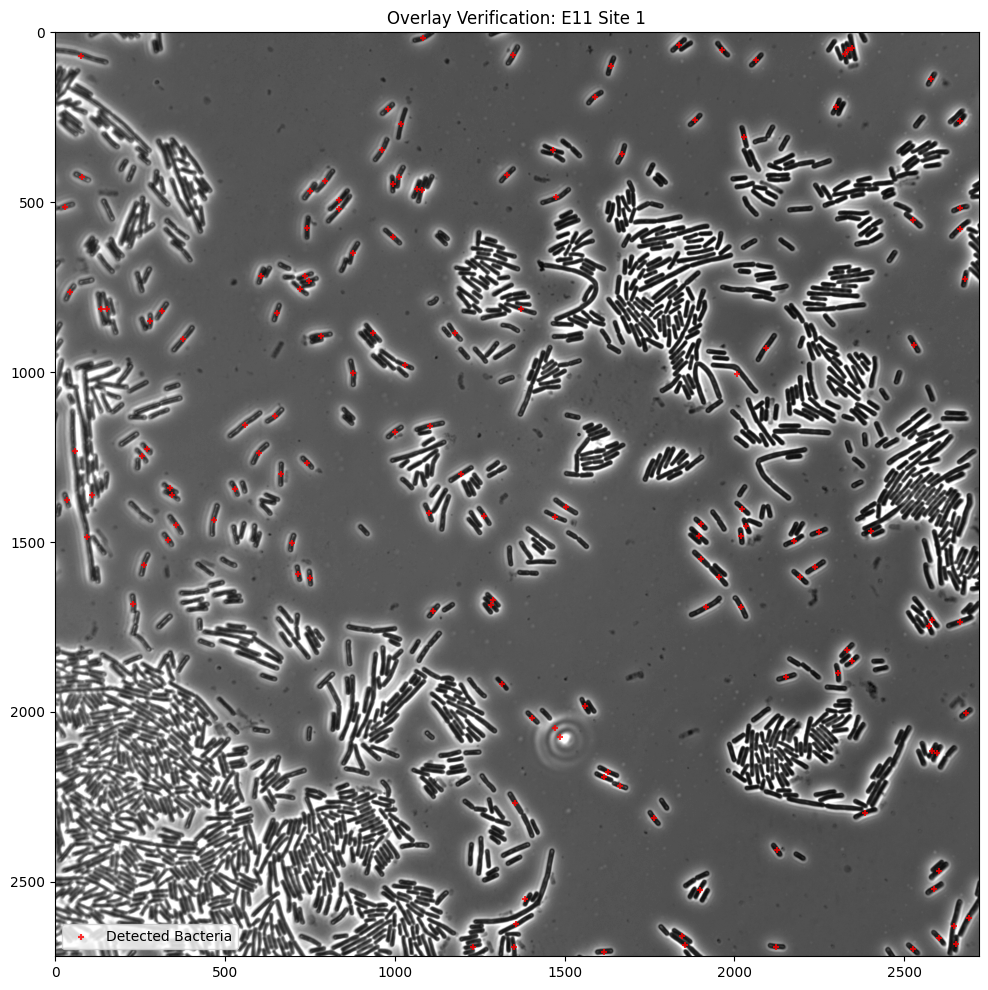

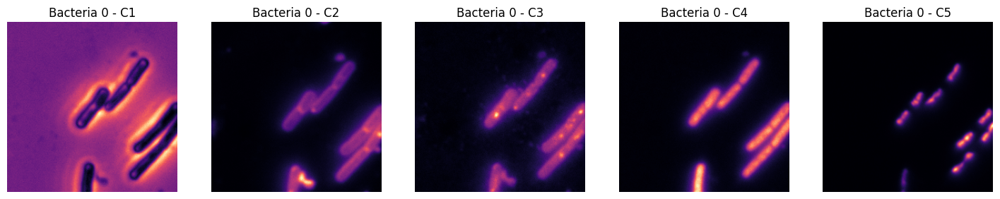

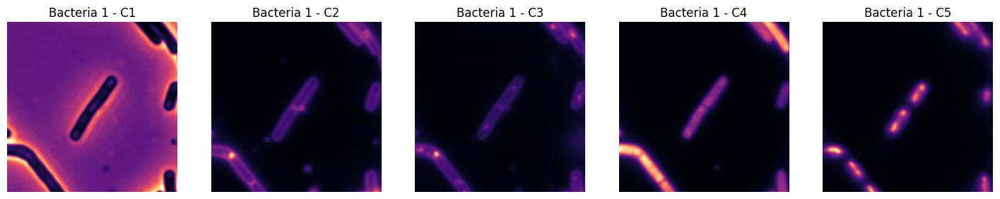

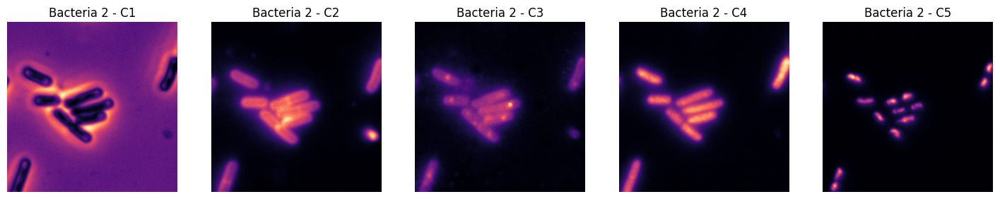

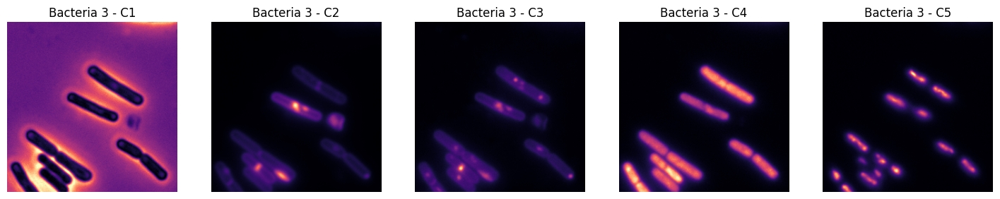

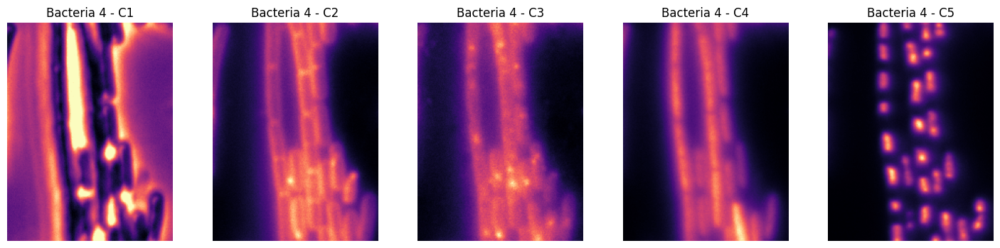

In [6]:
#check juist center profiling zegt idd 15 cells dus ok:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import skimage.io
import os

# --- NEW CONFIGURATION (HARD DRIVE) ---
# Location of your generated CSVs
loc_dir = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/locations_maskingneighbours/PLATE1_T2"
# Location of your raw images (via the symlink or direct path)
image_dir = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/images"
# Your index file
index_meta_path = "/media/arnout/Elements/groteEdeepprofilerdingen/deepprofileroutputsetc/testset/inputs/metadata/index.csv"

# 1. Pick a specific Well and Site to inspect
target_well = "E11"
target_site = 1

# 2. Load the index to find the image paths
idx_df = pd.read_csv(index_meta_path)
row = idx_df[(idx_df['Metadata_Well'] == target_well) & (idx_df['Metadata_Site'] == target_site)].iloc[0]

# 3. Load the coordinates directly from your new location file
loc_file = os.path.join(loc_dir, f"{target_well}-{target_site}-Nuclei.csv")
site_data = pd.read_csv(loc_file)

print(f"Inspecting {target_well} Site {target_site}")
print(f"Found {len(site_data)} objects in location file.")

# --- PART A: FULL IMAGE OVERLAY ---
c1_path = os.path.join(image_dir, row['C1'])
img_c1 = skimage.io.imread(c1_path)

plt.figure(figsize=(12, 12))
vmax = np.percentile(img_c1, 99.5)  # Contrast stretch
plt.imshow(img_c1, cmap='gray', vmax=vmax)
plt.scatter(site_data['Nuclei_Location_Center_X'], 
            site_data['Nuclei_Location_Center_Y'], 
            s=20, c='red', marker='+', alpha=0.8, label='Detected Bacteria')
plt.title(f"Overlay Verification: {target_well} Site {target_site}")
plt.legend()
plt.show()

# --- PART B: INDIVIDUAL CROPS ---
# View 5 random bacteria to check centering
sample_cells = site_data.sample(5)
box_size = 224 # DeepProfiler uses 224 in your config
half_box = box_size // 2

for i, (_, cell) in enumerate(sample_cells.iterrows()):
    cx, cy = int(cell['Nuclei_Location_Center_X']), int(cell['Nuclei_Location_Center_Y'])
    
    fig, axes = plt.subplots(1, 5, figsize=(18, 4))
    channels = ['C1', 'C2', 'C3', 'C4', 'C5']
    
    for j, ch_key in enumerate(channels):
        ch_full = skimage.io.imread(os.path.join(image_dir, row[ch_key]))
        
        # Crop with bounds checking
        y1, y2 = max(0, cy-half_box), min(ch_full.shape[0], cy+half_box)
        x1, x2 = max(0, cx-half_box), min(ch_full.shape[1], cx+half_box)
        crop = ch_full[y1:y2, x1:x2]
        
        axes[j].imshow(crop, cmap='magma')
        axes[j].set_title(f"Bacteria {i} - {ch_key}")
        axes[j].axis('off')
    plt.show()

In [ ]:
#full plate neibhours no deduplication

In [7]:
import os
import pandas as pd
import imageio.v2 as imageio
import re
import numpy as np
from skimage import measure
from scipy.spatial import KDTree 

# --- CONFIGURATION ---


root_dir = "/media/arnout/Elements1/Thesis/Screen crispri quality checked"
loc_dir = "/media/arnout/Elements1/Thesis/project_masking_label/inputs/locations"
os.makedirs(loc_dir, exist_ok=True)

MIN_AREA_THRESHOLD = 700 
BOX_SIZE = 224
SQUARE_RADIUS = BOX_SIZE / 2  # 112 pixels
MAX_NEIGHBORS = 4
mask_pattern = re.compile(r"Sample_(?P<well>[A-Z][0-9]+)_XY(?P<site>[0-9]+)_C1_cp_masks\.tif+")

found_count = 0

# Specifically looking at PLATE1_T2 as per your requirement
for plate in ["PLATE1_T2"]:
    plate_path = os.path.join(root_dir, plate)
    if not os.path.exists(plate_path): continue
    
    for well_folder in os.listdir(plate_path):
        if not well_folder.startswith("Sample_") or "bad_Q" in well_folder: continue
        mask_folder = os.path.join(plate_path, well_folder, "masks")
        
        if os.path.exists(mask_folder):
            for mask_name in os.listdir(mask_folder):
                match = mask_pattern.search(mask_name)
                if not match: continue
                
                well = match.group('well')
                site = match.group('site')
                out_filename = f"{well}-{site}-Nuclei.csv"
                
                # Load and get centroids
                mask_data = imageio.imread(os.path.join(mask_folder, mask_name))
                props = measure.regionprops(mask_data)
                
                # 1. Area Threshold Filtering
                all_coords = np.array([[p.centroid[1], p.centroid[0]] for p in props if p.area >= MIN_AREA_THRESHOLD])
                
                if len(all_coords) == 0: continue

                # 2. Neighbor Count Filtering (Square/Chebyshev distance)
                tree = KDTree(all_coords)
                final_locations = []

                for i in range(len(all_coords)):
                    # Find indices of all points within the square radius
                    # p=float('inf') makes the search area a square box
                    neighbor_indices = tree.query_ball_point(all_coords[i], r=SQUARE_RADIUS, p=float('inf'))
                    
                    # neighbor_count excludes the cell itself
                    neighbor_count = len(neighbor_indices) - 1
                    
                    if neighbor_count <= MAX_NEIGHBORS:
                        final_locations.append({
                            "Nuclei_Location_Center_X": all_coords[i][0], 
                            "Nuclei_Location_Center_Y": all_coords[i][1]
                        })
                
                if final_locations:
                    save_path = os.path.join(loc_dir, out_filename)
                    pd.DataFrame(final_locations).to_csv(save_path, index=False)
                    found_count += 1
                    print(f"  > Created {out_filename}: {len(final_locations)} cells kept (Filtered from {len(all_coords)})")

print(f"\nSuccess! Total location files: {found_count}")

  > Created G10-10-Nuclei.csv: 101 cells kept (Filtered from 274)
  > Created G10-11-Nuclei.csv: 169 cells kept (Filtered from 304)
  > Created G10-12-Nuclei.csv: 124 cells kept (Filtered from 181)
  > Created G10-15-Nuclei.csv: 106 cells kept (Filtered from 141)
  > Created G10-16-Nuclei.csv: 122 cells kept (Filtered from 189)
  > Created G10-17-Nuclei.csv: 106 cells kept (Filtered from 175)
  > Created G10-18-Nuclei.csv: 126 cells kept (Filtered from 185)
  > Created G10-19-Nuclei.csv: 98 cells kept (Filtered from 136)
  > Created G10-6-Nuclei.csv: 2 cells kept (Filtered from 2)
  > Created G10-7-Nuclei.csv: 125 cells kept (Filtered from 911)
  > Created G10-8-Nuclei.csv: 151 cells kept (Filtered from 312)
  > Created G10-9-Nuclei.csv: 161 cells kept (Filtered from 787)
  > Created G11-12-Nuclei.csv: 82 cells kept (Filtered from 583)
  > Created G11-13-Nuclei.csv: 75 cells kept (Filtered from 171)
  > Created G11-14-Nuclei.csv: 108 cells kept (Filtered from 200)
  > Created G11-15-Nu

In [ ]:
#plate T0 en T1 

In [4]:
import os
import pandas as pd
import imageio.v2 as imageio
import re
import numpy as np
from skimage import measure
from scipy.spatial import KDTree 

# --- CONFIGURATION ---
root_dir = "/media/arnout/Elements1/Thesis/Screen crispri quality checked"
# This is now the base directory; the script will add the plate name automatically
loc_base = "/media/arnout/Elements1/Thesis/project_neighboursT20/inputs/locations"

MIN_AREA_THRESHOLD = 700 
BOX_SIZE = 224
SQUARE_RADIUS = BOX_SIZE / 2  # 112 pixels
MAX_NEIGHBORS = 2  # Maximum neighbors allowed within the square box

mask_pattern = re.compile(r"Sample_(?P<well>[A-Z][0-9]+)_XY(?P<site>[0-9]+)_C1_cp_masks\.tif+")

found_count = 0

# Add as many plates as you like to this list
#for plate in ["PLATE1_T0", "PLATE1_T2"]:
for plate in ["PLATE2_T0", "PLATE2_T1", "PLATE2_T2"]:
    if not plate.startswith("PLATE"): continue
    
    # 1. CREATE DYNAMIC PLATE DIRECTORY
    plate_loc_dir = os.path.join(loc_base, plate)
    os.makedirs(plate_loc_dir, exist_ok=True)
    
    plate_path = os.path.join(root_dir, plate)
    if not os.path.exists(plate_path):
        print(f"Warning: Plate path {plate_path} does not exist. Skipping.")
        continue
    
    print(f"Processing {plate}...")

    for well_folder in os.listdir(plate_path):
        if not well_folder.startswith("Sample_") or "bad_Q" in well_folder: continue
        mask_folder = os.path.join(plate_path, well_folder, "masks")
        
        if os.path.exists(mask_folder):
            for mask_name in os.listdir(mask_folder):
                match = mask_pattern.search(mask_name)
                if not match: continue
                
                well = match.group('well')
                site = match.group('site')
                out_filename = f"{well}-{site}-Nuclei.csv"
                
                mask_data = imageio.imread(os.path.join(mask_folder, mask_name))
                props = measure.regionprops(mask_data)
                
                # Area filter
                all_coords = np.array([[p.centroid[1], p.centroid[0]] for p in props if p.area >= MIN_AREA_THRESHOLD])
                
                if len(all_coords) == 0: continue

                # --- SPATIAL NEIGHBOR FILTERING ---
                tree = KDTree(all_coords)
                final_locations = []

                for i in range(len(all_coords)):
                    # Square search using p=inf
                    neighbor_indices = tree.query_ball_point(all_coords[i], r=SQUARE_RADIUS, p=float('inf'))
                    neighbor_count = len(neighbor_indices) - 1
                    
                    # Keep if the neighborhood is not too crowded
                    if neighbor_count <= MAX_NEIGHBORS:
                        final_locations.append({
                            "Nuclei_Location_Center_X": all_coords[i][0], 
                            "Nuclei_Location_Center_Y": all_coords[i][1]
                        })

                if final_locations:
                    save_path = os.path.join(plate_loc_dir, out_filename)
                    pd.DataFrame(final_locations).to_csv(save_path, index=False)
                    found_count += 1
                    print(f"  > Created {out_filename} in {plate}: {len(final_locations)} cells kept")

print(f"\nSuccess! Total location files generated: {found_count}")

Processing PLATE2_T0...
  > Created B8-0-Nuclei.csv in PLATE2_T0: 55 cells kept
  > Created B8-10-Nuclei.csv in PLATE2_T0: 56 cells kept
  > Created B8-11-Nuclei.csv in PLATE2_T0: 48 cells kept
  > Created B8-12-Nuclei.csv in PLATE2_T0: 37 cells kept
  > Created B8-13-Nuclei.csv in PLATE2_T0: 38 cells kept
  > Created B8-14-Nuclei.csv in PLATE2_T0: 60 cells kept
  > Created B8-15-Nuclei.csv in PLATE2_T0: 33 cells kept
  > Created B8-16-Nuclei.csv in PLATE2_T0: 49 cells kept
  > Created B8-17-Nuclei.csv in PLATE2_T0: 46 cells kept
  > Created B8-18-Nuclei.csv in PLATE2_T0: 43 cells kept
  > Created B8-19-Nuclei.csv in PLATE2_T0: 52 cells kept
  > Created B8-1-Nuclei.csv in PLATE2_T0: 29 cells kept
  > Created B8-2-Nuclei.csv in PLATE2_T0: 60 cells kept
  > Created B8-3-Nuclei.csv in PLATE2_T0: 43 cells kept
  > Created B8-4-Nuclei.csv in PLATE2_T0: 55 cells kept
  > Created B8-5-Nuclei.csv in PLATE2_T0: 33 cells kept
  > Created B8-6-Nuclei.csv in PLATE2_T0: 36 cells kept
  > Created B8

In [9]:
#masksize, still to be done
import os
import pandas as pd
import imageio.v2 as imageio
import re
from pathlib import Path

# --- CONFIGURATION ---
root_dir = Path("/media/arnout/Elements1/Thesis/Screen crispri quality checked")
# Path where your PREVIOUSLY GENERATED Nuclei.csv files are
loc_base = Path("/media/arnout/Elements1/Thesis/my_dp_project_neighbours/inputs/locations")
# Destination for the report
area_report_path = Path("/media/arnout/Elements1/Thesis/my_dp_project_neighbours/inputs/cell_area_report.csv")

mask_pattern = re.compile(r"Sample_(?P<well>[A-Z][0-9]+)_XY(?P<site>[0-9]+)_C1_cp_masks\.tif")

area_stats = []

# Process the same plates as before
for plate in ["PLATE1_T2"]:
    plate_loc_dir = loc_base / plate
    plate_img_dir = root_dir / plate
    
    if not plate_loc_dir.exists():
        print(f"Skipping {plate}: Location folder not found.")
        continue

    print(f"Extracting areas for {plate}...")

    # Look at the CSV files you already created
    for csv_file in os.listdir(plate_loc_dir):
        if not csv_file.endswith("-Nuclei.csv"): continue
        
        # Parse well and site from filename (e.g., A1-0-Nuclei.csv)
        parts = csv_file.replace("-Nuclei.csv", "").split("-")
        well_id, site_id = parts[0], parts[1]
        
        # 1. Load your existing coordinates
        df_coords = pd.read_csv(plate_loc_dir / csv_file)
        if df_coords.empty: continue

        # 2. Locate the corresponding mask file
        well_folder = f"Sample_{well_id}"
        mask_folder = plate_img_dir / well_folder / "masks"
        
        # Find the specific mask for this site
        mask_name = None
        if mask_folder.exists():
            for f in os.listdir(mask_folder):
                if f"XY{site_id}_C1" in f and f.endswith(".tif"):
                    mask_name = f
                    break
        
        if not mask_name:
            print(f"      ! Mask not found for {csv_file}")
            continue

        # 3. Load mask and get areas
        mask_data = imageio.imread(mask_folder / mask_name)
        # Get areas of all objects in this mask once
        # Using np.unique with count is much faster than regionprops for just areas
        import numpy as np
        labels, counts = np.unique(mask_data, return_counts=True)
        area_lookup = dict(zip(labels, counts))

        # 4. Map coordinates to the area of the object at that pixel
        for _, row in df_coords.iterrows():
            x, y = int(row["Nuclei_Location_Center_X"]), int(row["Nuclei_Location_Center_Y"])
            
            # Get the Label ID at this coordinate (Note: imageio is Y, X indexed)
            label_id = mask_data[y, x]
            
            if label_id > 0: # 0 is background
                area_stats.append({
                    "Plate": plate,
                    "Well": well_id,
                    "Site": site_id,
                    "Area": area_lookup.get(label_id, 0)
                })

# --- SAVE ---
if area_stats:
    pd.DataFrame(area_stats).to_csv(area_report_path, index=False)
    print(f"\nDone! Area report for existing files saved to: {area_report_path}")

Extracting areas for PLATE1_T2...

Done! Area report for existing files saved to: /media/arnout/Elements1/Thesis/my_dp_project_neighbours/inputs/cell_area_report.csv
